# Table Of Contents
### 1. Modules
### 2. Getting Image 
### 3. Conversion
### 4. Photo Filters
### 5. Slicing & Merging
### 6. Pixelize
### 7. Extracting Colors

## 1. Modules

In [40]:
# Modules
import numpy as np
import pandas as pd
from PIL import Image
from urllib import request
from math import gcd
from random import shuffle, randint

## 2. Getting Image

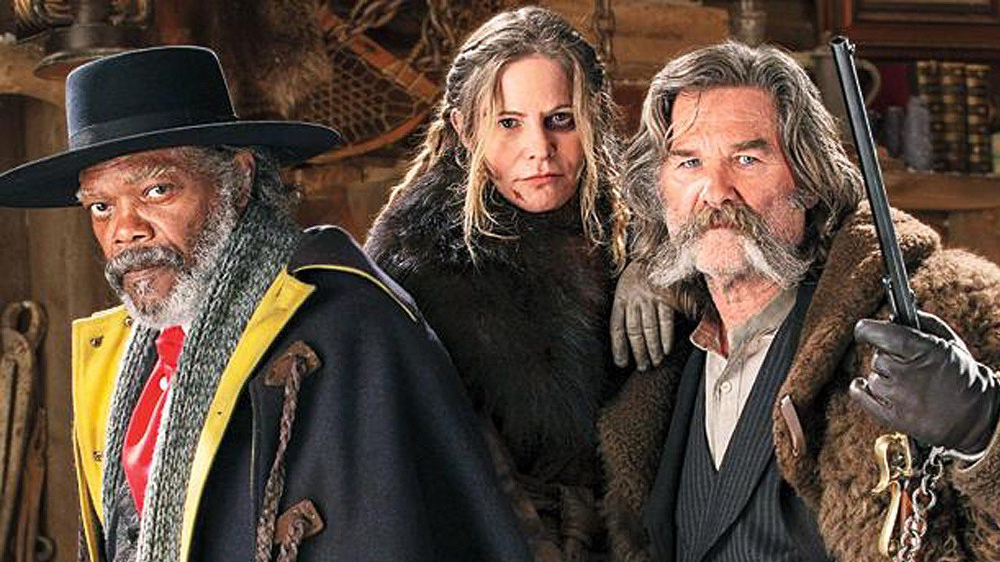

In [41]:
#from url - examples
photo = 'https://www.porta.com.pl/otworzsiena/phavi/ph/r,1035,0/upl/2018/0104/0137-filharmonia-szczecin.jpg?token=53cbb9ae'
hatefull_8 = 'https://sm.ign.com/t/ign_pl/blogroll/c/comic-con-/comic-con-quentin-tarantino-and-the-hateful-eight_5wcu.1280.jpg'
mclaren = 'https://ocdn.eu/pulscms-transforms/1/gjnk9kqTURBXy84YmIzOWE4MjYwNzY1NDMyYjliMmZmM2IyYzYxMjhiMC5qcGVnkpUDGADNAm7NAV6TBc0C-M0BXoKhMAWhMQA'

request.urlretrieve(hatefull_8,'photo.jpg')
img = Image.open('photo.jpg')
img

#from your desktop
# img = Image.open('.../Desktop/photo.jpg')

## 3. Conversion

In [42]:
# from image to numpy array
np_arr = np.array(img)

# from numpy array to image
out_img = Image.fromarray(np_arr)

## 4. Photo Filters

### NEGATIVE

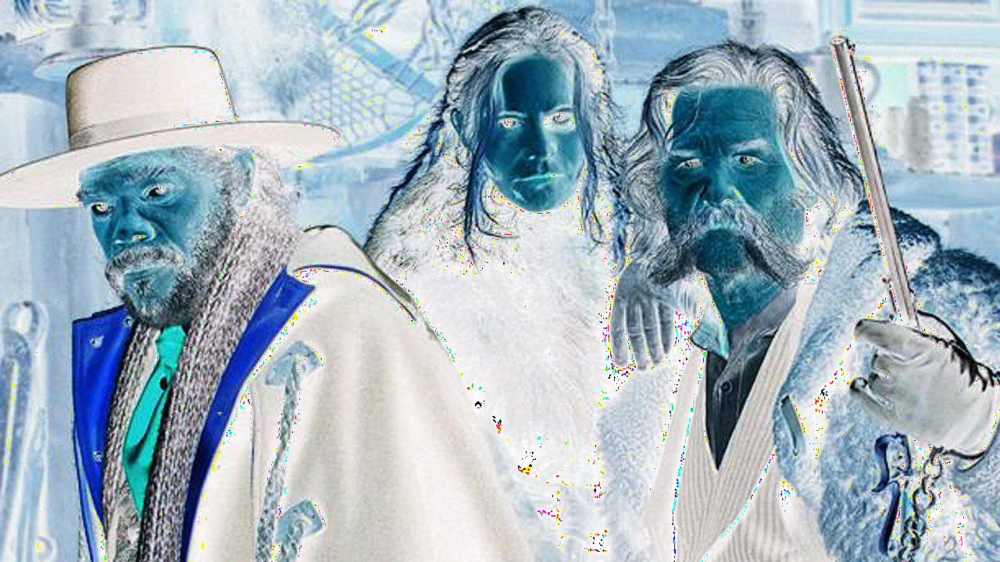

In [43]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATION - NEGATIVE
a = np.negative(a) 

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### GREYSCALE

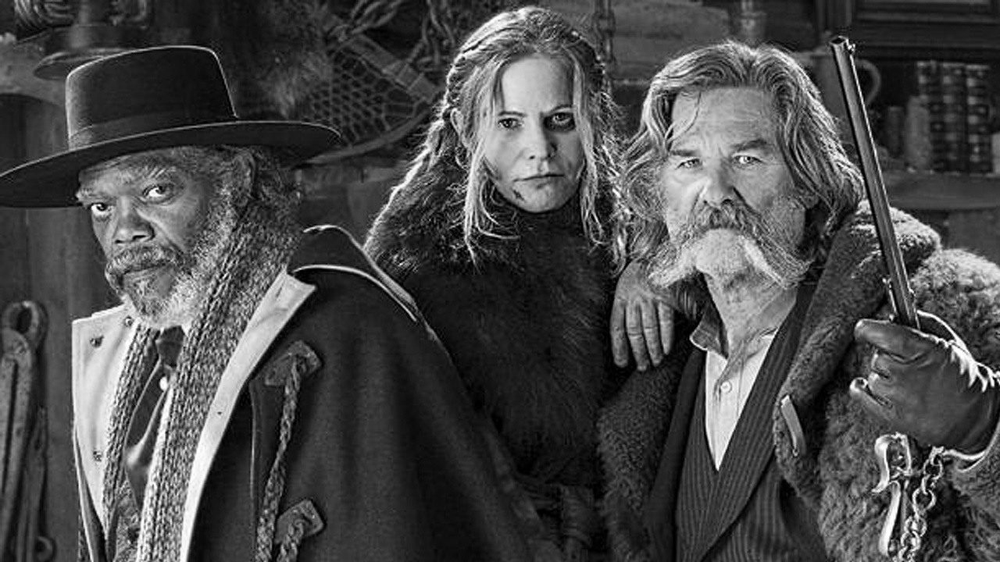

In [44]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATION  
a = a[:,:,1] # or a[:,:,0] or a[:,:,2]

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### RGB CHANNELS SWAP

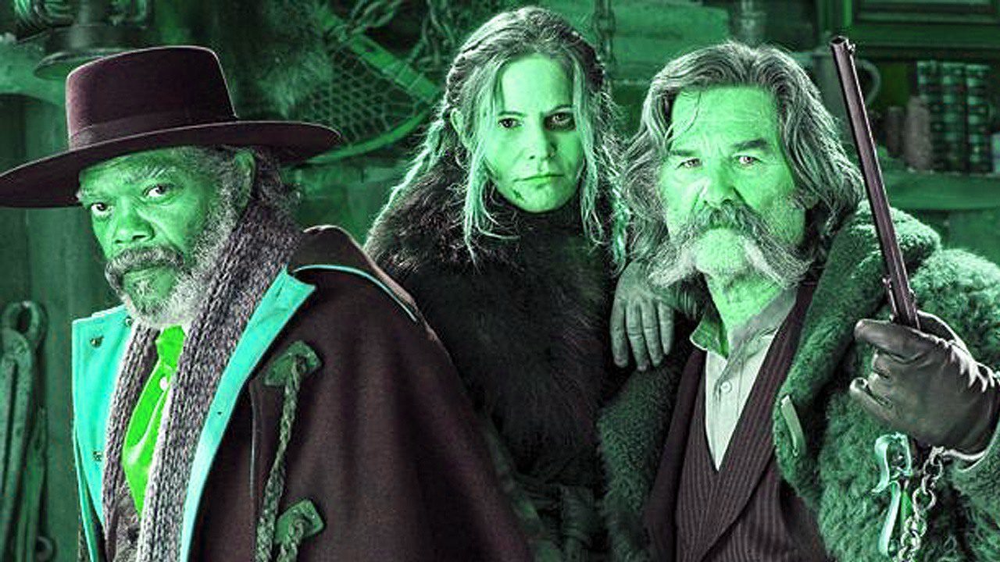

In [45]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATION - R,G,B SWAP  
a = a[:,:,(2,0,1)]

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### CHANNEL/S TO SPECIFIC VALUE

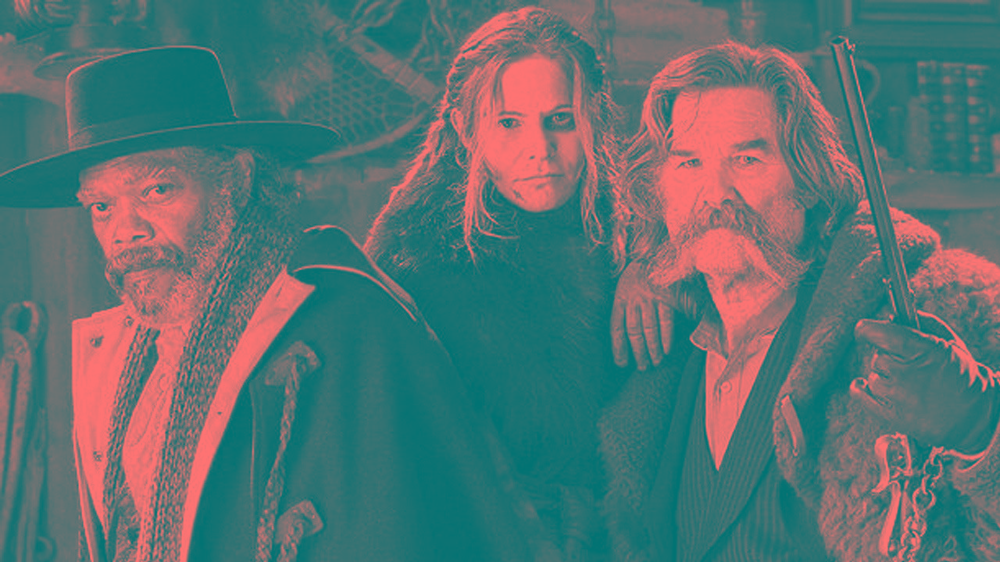

In [46]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATION  # BLUE = 115, GREEN = 115
a[:,:,[2,1]] = 115 

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### FAR COLORS

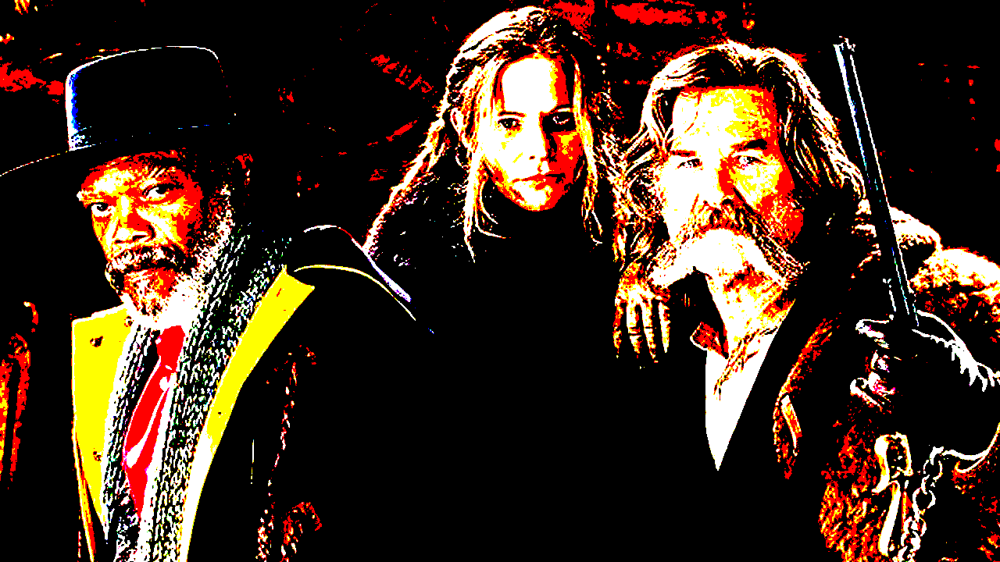

In [47]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
a[:,:,0] = np.where(a[:,:,0]<128,0,255)
a[:,:,1] = np.where(a[:,:,1]<128,0,255) 
a[:,:,2] = np.where(a[:,:,2]<128,0,255)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### BLACK & WHITE

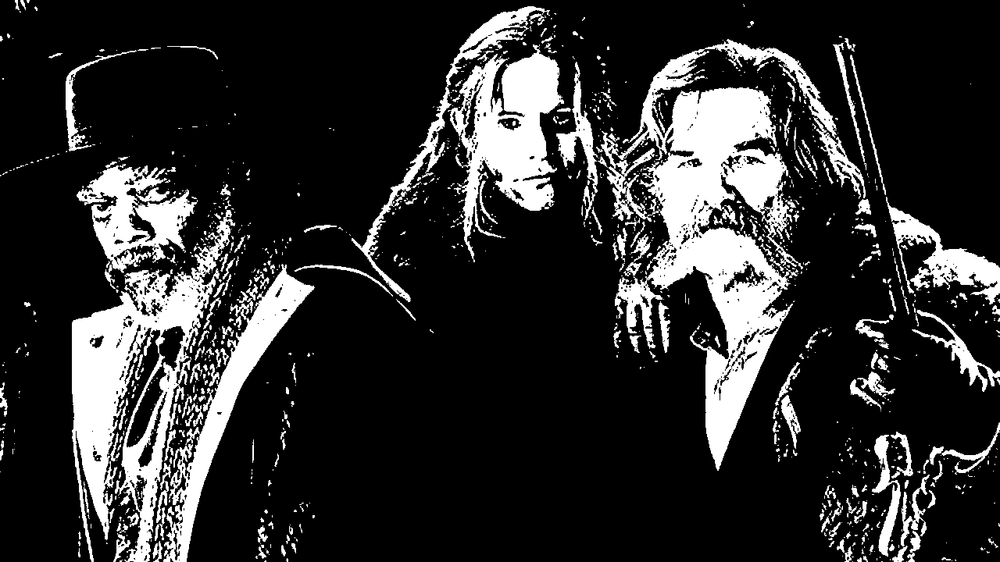

In [48]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
t =  np.mean(a,axis=2)
a[:,:,0] = np.where(t>128,255,0)
a[:,:,1] = np.where(t>128,255,0)
a[:,:,2] = np.where(t>128,255,0)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### 3 COLORS

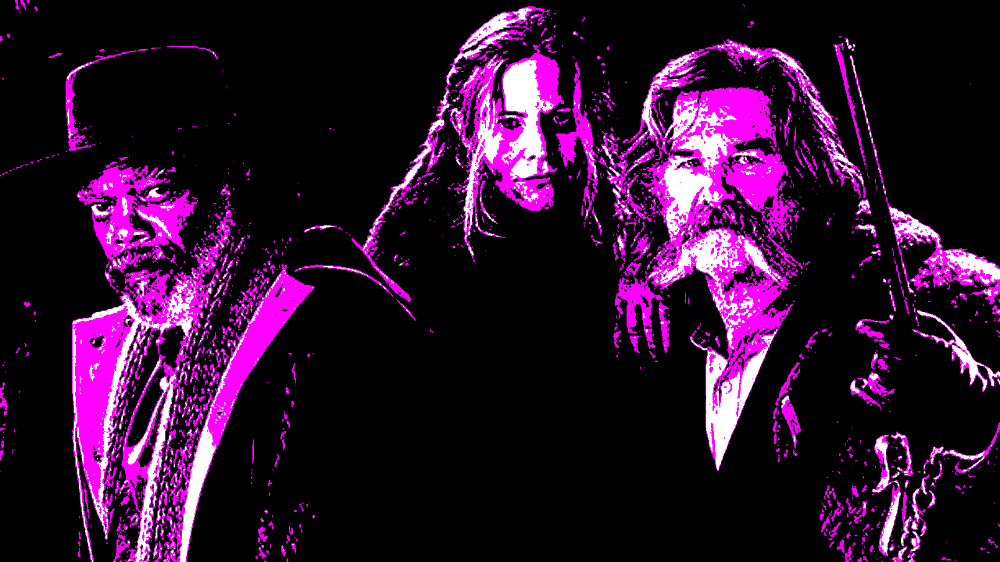

In [49]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
t =  np.mean(a,axis=2)
a[:,:,0] = np.where(t>128,255,0)
a[:,:,1] = np.where(t>192,255,0)
a[:,:,2] = np.where(t>128,255,0)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### 4 COLORS

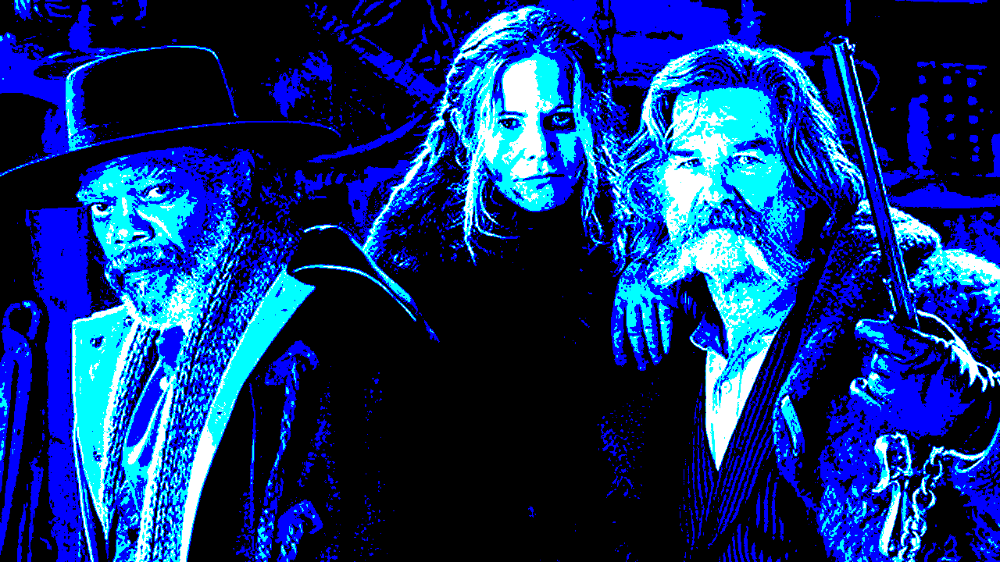

In [50]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
t =  np.mean(a,axis=2)
a[:,:,0] = np.where(t>192,255,0)
a[:,:,1] = np.where(t>128,255,0)
a[:,:,2] = np.where(t>64,255,0)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### MIDD&OUT COLORS 

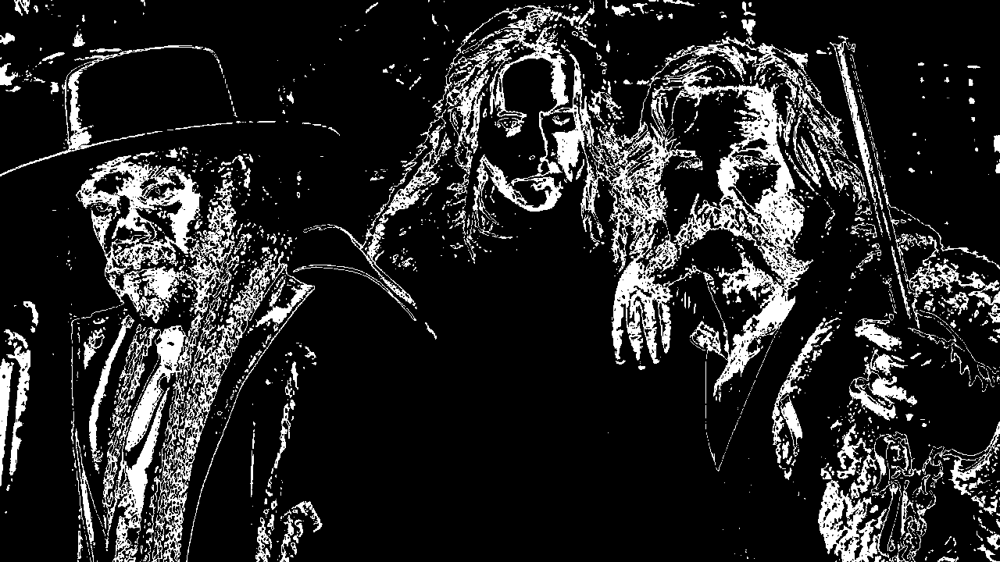

In [51]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
t =  np.mean(a,axis=2)
a[:,:,0] = np.where((t>96)& (t<160),255,0)
a[:,:,1] = np.where((t>96)& (t<160),255,0)
a[:,:,2] = np.where((t>96)& (t<160),255,0)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

### GRAINS

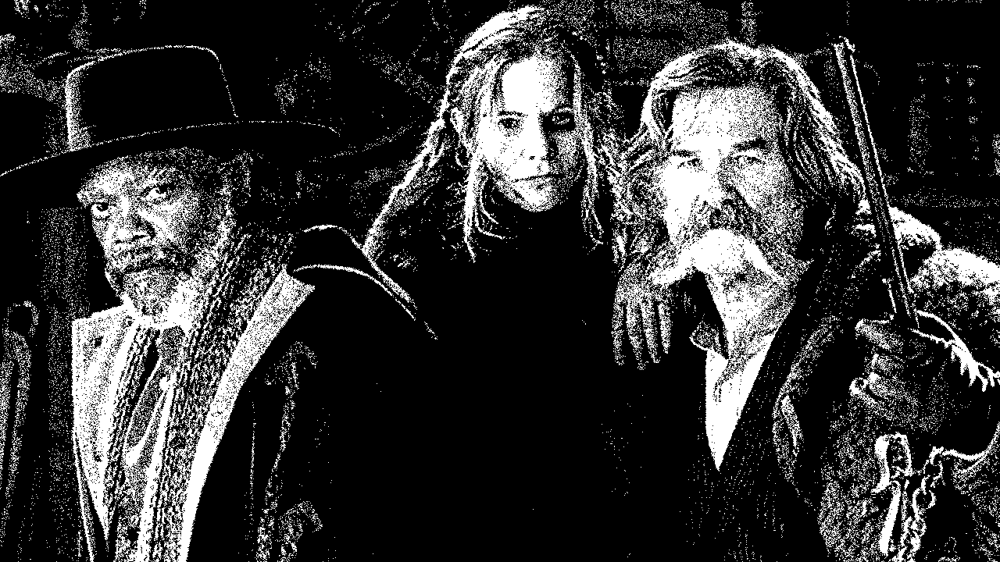

In [52]:
# copy of an numpy array 
a = np.copy(np_arr)

# OPERATIONS
t =  np.mean(a,axis=2)
tab = np.random.randint(64,192,t.shape)
a[:,:,0] = np.where(t>tab,255,0)
a[:,:,1] = np.where(t>tab,255,0)
a[:,:,2] = np.where(t>tab,255,0)

# from numpy array to img
out_img = Image.fromarray(a)
out_img

## 5. Slicing & Merging

In [53]:
a.shape

(720, 1280, 3)

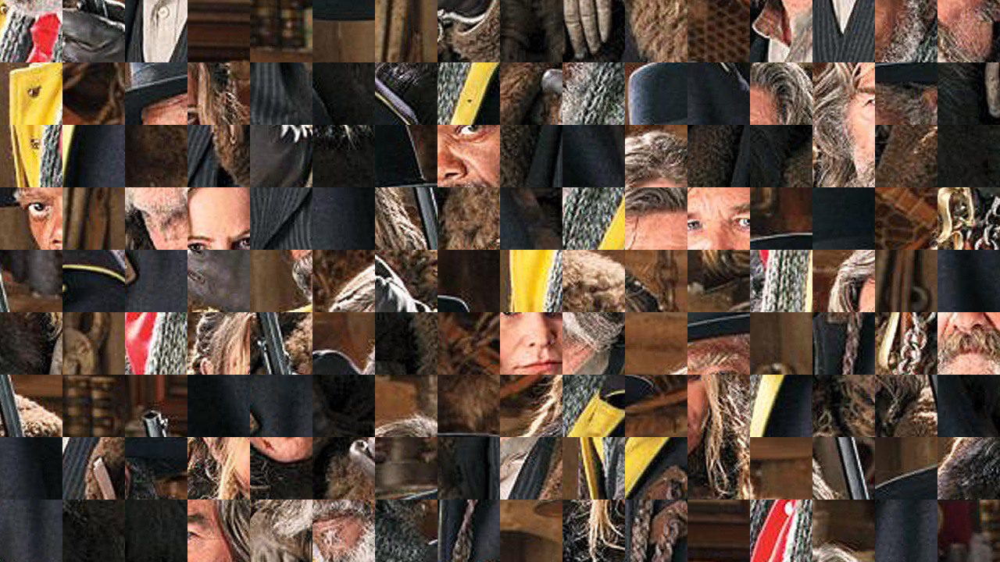

In [54]:
a = np.copy(np_arr)

#the greatest common factor 
g = gcd(a.shape[0], a.shape[1])

#SLICING
pieces = []
for y in range(0,a.shape[0], g):
    for x in range(0,a.shape[1], g):
        pieces.append(np.array(a[y:y+g, x:x+g]))
    
#REARRANGING
shuffle(pieces)

#MERGING SLICES
arr = np.zeros(a.shape)
i=0
for y in range(0,a.shape[0], g):
    for x in range(0, a.shape[1], g):
        arr[y:y+g, x:x+g] = pieces[i]
        i+= 1
        
arr = arr.astype(np.uint8)
out_img = Image.fromarray(arr)
out_img

## 6. PIXELIZE

### 6.1 SQUARE PIXELS

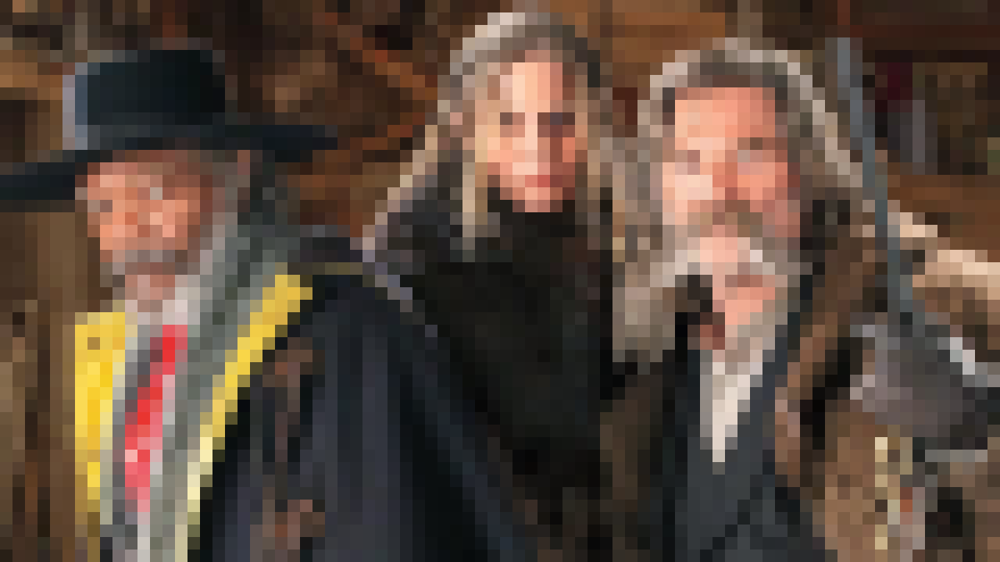

In [55]:
a = np.copy(np_arr)

#common factors list
common_factors = []
for x in range(2,max(a.shape)):
    if (a.shape[0] % x == 0) and (a.shape[1] % x == 0):
        common_factors.append(x)
                 
fac = common_factors[randint(0,len(common_factors)-1)]    #     -> random factor

if len(common_factors) == 0:
    print('cant pixelize')

#SLICING
pieces = []
for y in range(0,a.shape[0], fac):
    for x in range(0,a.shape[1], fac):
        r,g,b = np.mean(a[y:y+fac,x:x+fac,0]), np.mean(a[y:y+fac,x:x+fac,1]), np.mean(a[y:y+fac,x:x+fac,2])
        r,g,b = int(np.round(r)), int(np.round(g)), int(np.round(b))
        t = np.array([r,g,b])
        pieces.append(np.tile(t,(fac,fac,1)))
           
#MERGING SLICES
arr = np.zeros(a.shape)
i=0
for y in range(0,a.shape[0], fac):
    for x in range(0, a.shape[1], fac):
        arr[y:y+fac, x:x+fac] = pieces[i]
        i+= 1
        
arr = arr.astype(np.uint8)
out_img = Image.fromarray(arr)
out_img

### 6.2 Random Pixel Size

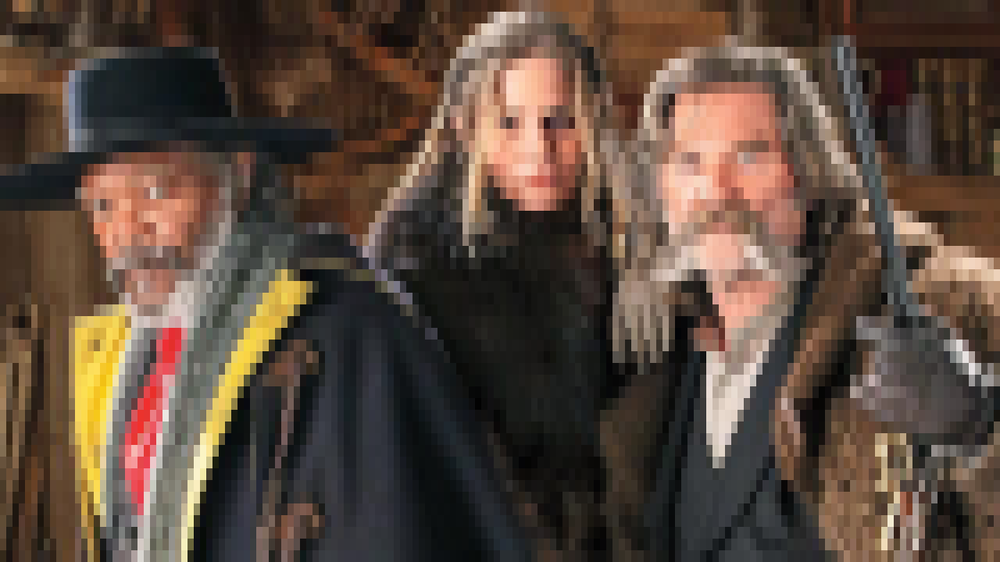

In [58]:
a = np.copy(np_arr)

#common factors list
x_common_factors, y_common_factors = [], []

for z in range(2,a.shape[0]):
    if a.shape[0] % z == 0:
        y_common_factors.append(z)
        
for z in range(2,a.shape[1]):
    if a.shape[1] % z == 0:
        x_common_factors.append(z)
        
if (len(y_common_factors) == 0) and (len(x_common_factors) == 0):
    print('cant pixelize')
    
        
fac_y = y_common_factors[randint(0,len(y_common_factors)-1)]             
fac_x = x_common_factors[randint(0,len(x_common_factors)-1)]

#SLICING
pieces = []
for y in range(0,a.shape[0], fac_y):
    for x in range(0,a.shape[1], fac_x):
        r,g,b = np.mean(a[y:y+fac_y,x:x+fac_x,0]), np.mean(a[y:y+fac_y,x:x+fac_x,1]), np.mean(a[y:y+fac_y,x:x+fac_x,2])
        r,g,b = int(np.round(r)), int(np.round(g)), int(np.round(b))
        t = np.array([r,g,b])
        pieces.append(np.tile(t,(fac_y,fac_x,1)))
           
#MERGING SLICES
arr = np.zeros(a.shape)
i=0
for y in range(0,a.shape[0], fac_y):
    for x in range(0, a.shape[1], fac_x):
        arr[y:y+fac_y, x:x+fac_x] = pieces[i]
        i+= 1
        
arr = arr.astype(np.uint8)
out_img = Image.fromarray(arr)
out_img

## 7.Extracting Colors

### MEAN COLOR

[90 73 61]


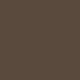

In [61]:
a = np.copy(np_arr)

r,g,b = np.mean(a[:,:,0]), np.mean(a[:,:,1]), np.mean(a[:,:,2])
r,g,b = int(np.round(r)), int(np.round(g)), int(np.round(b))
a = np.array([r,g,b]).astype(np.uint8)
print(a)
a = np.tile(a,(80,80,1))


out_img = Image.fromarray(a)
out_img

### GRADIENT

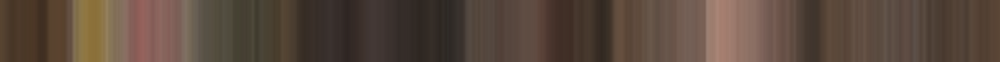

In [62]:
a = np.copy(np_arr)

arr = np.mean(a,axis=0)
arr = np.stack([arr]*80)
arr = arr.astype(np.uint8)

out_img = Image.fromarray(arr)
out_img

### % OF POSSIBLE COLORS

In [63]:
a = np.copy(np_arr)
unique, counts = np.unique(a.reshape(a.shape[0]*a.shape[1],a.shape[2]) ,axis=0, return_counts=True)
per = (len(unique)/(256**3))*100
print(f'The image contains {round(per,2)} % of all possible colors in RGB scale')

The image contains 0.93 % of all possible colors in RGB scale


### THE MOST FREQUENT SIMMILAR COLORS

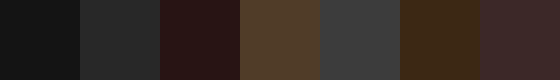

In [64]:
a = np.copy(np_arr)

num = randint(10,30)  # the hesitation is half num

# grouping 
a[:,:,0] = np.where(a[:,:,0]%num > num/2, num*(np.floor(a[:,:,0]/num)+1), num*(np.floor(a[:,:,0]/num)))
a[:,:,1] = np.where(a[:,:,1]%num > num/2, num*(np.floor(a[:,:,1]/num)+1), num*(np.floor(a[:,:,1]/num)))
a[:,:,2] = np.where(a[:,:,2]%num > num/2, num*(np.floor(a[:,:,2]/num)+1), num*(np.floor(a[:,:,2]/num)))

#extracting
unique, counts = np.unique(a.reshape(a.shape[0]*a.shape[1],a.shape[2]) ,axis=0, return_counts=True)

#sorting
s = pd.Series(np.vsplit(unique,len(unique)), counts).sort_index(ascending=False).explode()

how_many = randint(3,10) #how many colors to extract

#merging
arr = np.concatenate((s.values[:how_many]), axis=0).reshape(how_many,3)
arr = np.repeat(arr[:], 80, axis=0).reshape(1, how_many*80, 3)
arr = np.repeat(arr[:], 80, axis=0).reshape(80,80*how_many , 3)
arr = arr.astype(np.uint8)

#displaying
out_img = Image.fromarray(arr)
out_img